In [1]:
import pandas as pd
from matplotlib import pyplot as plt
from upsetplot import UpSet
import scanpy as sc
import omicverse as ov
ov.plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.11, Tutorials: https://omicverse.readthedocs.io/
Dependency error: The 'phate>=1.0' distribution was not found and is required by the application


In [2]:
df = pd.read_excel("/mnt/longterm/lugli/spuccio/SP044_GZMK/Signatures_GZMK.xlsx",sheet_name="Subs_DEG")

In [3]:
adata = sc.read("/home/lugli/spuccio/Projects/SP039/GBmap/TcellCD8_Data.h5ad")

In [4]:
adata= adata.raw.to_adata()

In [5]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=100, frameon=False, figsize=(5, 5), facecolor="white")

-----
anndata     0.11.3
scanpy      1.10.4
-----
PIL                 11.0.0
absl                NA
argcomplete         NA
asttokens           NA
autograd            NA
autograd_gamma      NA
backports           NA
boltons             NA
bs4                 4.13.2
certifi             2025.01.31
charset_normalizer  3.4.1
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.12
decorator           5.1.1
dill                0.3.9
et_xmlfile          2.0.0
etils               1.12.2
exceptiongroup      1.2.2
executing           2.2.0
filelock            3.13.1
fontTools           4.55.8
formulaic           1.1.1
fsspec              2024.6.1
gdown               5.2.0
google              NA
graphlib            NA
h5py                3.12.1
huggingface_hub     0.28.1
idna                3.10
igraph              0.11.8
interface_meta      1.3.0
ipykernel           6.29.5
ipywidgets          8.1.5
jaraco              

In [6]:
# Melt the DataFrame to long format
melted_df = df.melt(var_name='Set', value_name='Gene').dropna()

# Create a boolean DataFrame indicating the presence of each gene in each set
boolean_df = melted_df.assign(Presence=1).pivot_table(index='Gene', columns='Set', values='Presence', fill_value=0)

# Check the prepared DataFrame
print(boolean_df.head())

Set      3n5n_D7_1215_vs_Baseline.Max  3n5n_D7_1215_vs_Baseline.Min  \
Gene                                                                  
A1BG                              0.0                           0.0   
A2M                               0.0                           0.0   
A2M-AS1                           0.0                           0.0   
A2MP1                             0.0                           0.0   
AAAS                              0.0                           0.0   

Set      3n5n_DB_vs_Baseline.Max  3n5n_DB_vs_Baseline.Min  \
Gene                                                        
A1BG                         0.0                      0.0   
A2M                          0.0                      1.0   
A2M-AS1                      0.0                      1.0   
A2MP1                        0.0                      0.0   
AAAS                         1.0                      0.0   

Set      3p5n_D7_1215_vs_Baseline.Max  3p5n_D7_1215_vs_Baseline.Min  \
Gen

In [7]:
df2 = boolean_df.replace({0.0:False , 1.0: True}, inplace=False)

In [8]:
df2

Set,3n5n_D7_1215_vs_Baseline.Max,3n5n_D7_1215_vs_Baseline.Min,3n5n_DB_vs_Baseline.Max,3n5n_DB_vs_Baseline.Min,3p5n_D7_1215_vs_Baseline.Max,3p5n_D7_1215_vs_Baseline.Min,3p5n_D7_DB_vs_Baseline.Max,3p5n_D7_DB_vs_Baseline.Min,3p5p_D7_1215_vs_Baseline.Max,3p5p_D7_1215_vs_Baseline.Min,3p5p_D7_DB_vs_Baseline.Max,3p5p_D7_DB_vs_Baseline.Min
Gene,,,,,,,,,,,,
A1BG,False,False,False,False,False,True,False,True,False,True,False,True
A2M,False,False,False,True,False,True,False,True,False,True,False,True
A2M-AS1,False,False,False,True,False,True,False,True,False,True,False,True
A2MP1,False,False,False,False,False,True,False,True,False,True,False,True
AAAS,False,False,True,False,True,False,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,False,True,False,True,False,True,False,True,False,False,False,True
ZYG11B,False,True,False,False,False,True,False,False,False,True,False,True
ZYX,False,False,False,False,True,False,False,False,False,False,False,False


In [9]:
from upsetplot import from_indicators
from matplotlib import pyplot as plt
from upsetplot import generate_counts, plot

In [10]:
df3 = from_indicators(df2, data=df2)

In [11]:
df3

Set                                                                                                                                                                                                                                                                                                                                        3n5n_D7_1215_vs_Baseline.Max  \
3n5n_D7_1215_vs_Baseline.Max 3n5n_D7_1215_vs_Baseline.Min 3n5n_DB_vs_Baseline.Max 3n5n_DB_vs_Baseline.Min 3p5n_D7_1215_vs_Baseline.Max 3p5n_D7_1215_vs_Baseline.Min 3p5n_D7_DB_vs_Baseline.Max 3p5n_D7_DB_vs_Baseline.Min 3p5p_D7_1215_vs_Baseline.Max 3p5p_D7_1215_vs_Baseline.Min 3p5p_D7_DB_vs_Baseline.Max 3p5p_D7_DB_vs_Baseline.Min                                 
False                        False                        False                   False                   False                        True                         False                      True                       False                        True                         False                      True                                               False   
                                                                                  True                    False                        True                         False                      True                       False                        True                         False                      True                                               False   
                                                                                                                                                                                                                                                                                                               True                                               False   
                                                                                  False                   False                        True                         False                      True                       False                        True                         False                      True                                               False   
                                                          True                    False                   True                         False                        True                       False                      True                         False                        True                       False                                              False   
...                                                                                                                                                                                                                                                                                                                                                                 ...   
                             True                         False                   True                    False                        True                         False                      True                       False                        False                        False                      True                                               False   
                                                                                  False                   False                        True                         False                      False                      False                        True                         False                      True                                               False   
                             False                        False                   False                   True                         False                        False                      False                      False                        False                        False                      False                                              False   
       

<Figure size 1000x1000 with 0 Axes>

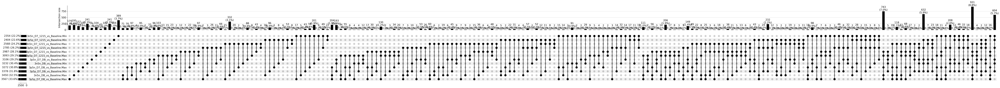

In [12]:
fig = plt.figure(figsize=(10, 10))
plot(df3,min_subset_size=2,show_counts=True,show_percentages=True)
plt.savefig("upset_plot_Subs_DEG.png", dpi=300)

plt.show()

In [13]:
filtered_dfs = {}  # Dictionary to store filtered DataFrames

for col in df2.columns:
    filtered_dfs[col] = df2.loc[
        (df2[col] == True) &  # The current column should be True
        (df2.drop(columns=[col]) == False).all(axis=1)  # All other columns should be False
    ]

In [14]:
filtered_dfs

{'3n5n_D7_1215_vs_Baseline.Max': Set      3n5n_D7_1215_vs_Baseline.Max  3n5n_D7_1215_vs_Baseline.Min  \
 Gene                                                                  
 ABHD11                           True                         False   
 ABT1                             True                         False   
 ACYP2                            True                         False   
 AKAP7                            True                         False   
 AKIP1                            True                         False   
 ...                               ...                           ...   
 ZCCHC17                          True                         False   
 ZMAT2                            True                         False   
 ZNF524                           True                         False   
 ZNF593                           True                         False   
 ZNHIT1                           True                         False   
 
 Set      3n5n_DB_vs_Baseline.

In [15]:
for col, df in filtered_dfs.items():
    gene_list = list(df.index)  # Extract gene list
    
    # Filter out genes not in adata.var_names
    valid_genes = [gene for gene in gene_list if gene in adata.var_names]

    if not valid_genes:  # Skip if no valid genes remain
        print(f"Skipping {col} - No valid genes found.")
        continue
    
    try:
        sc.tl.score_genes(
            adata=adata,
            gene_list=valid_genes,  # Use only valid genes
            ctrl_size=50,
            gene_pool=None,
            n_bins=25,
            score_name=f"{col}_Sig",  # Dynamically name the score
            random_state=0,
            use_raw=False,
        )
        print(f"Successfully scored {col}.")
    
    except Exception as e:
        print(f"Error processing {col}: {e}")


Successfully scored 3n5n_D7_1215_vs_Baseline.Max.
Successfully scored 3n5n_D7_1215_vs_Baseline.Min.
Successfully scored 3n5n_DB_vs_Baseline.Max.
Successfully scored 3n5n_DB_vs_Baseline.Min.
Successfully scored 3p5n_D7_1215_vs_Baseline.Max.
Successfully scored 3p5n_D7_1215_vs_Baseline.Min.
Successfully scored 3p5n_D7_DB_vs_Baseline.Max.
Successfully scored 3p5n_D7_DB_vs_Baseline.Min.
Successfully scored 3p5p_D7_1215_vs_Baseline.Max.
Successfully scored 3p5p_D7_1215_vs_Baseline.Min.
Successfully scored 3p5p_D7_DB_vs_Baseline.Max.
Successfully scored 3p5p_D7_DB_vs_Baseline.Min.


In [16]:
adata

AnnData object with n_obs × n_vars = 12873 × 13690
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status', '3n5n_D7_1215_vs_Baseline.Max_Sig', '3n5n_D7_1215_vs_Baseline.Min_Sig', '3n5n_DB_vs_Baseline.Max_Sig', '3n5n_DB_vs_Baseline.Min_Sig', '3p5n_D7_1215_vs_Baseline.Max_Sig', '3p5n_D7_1215_vs_Baseline.Min_Sig', '3p5n_D7_DB_vs_Baseline.Max_Sig', '3p5n_D7_DB_vs_Baseline.Min_Sig', '3p5p_D7_1215_vs_Baseline.Max_Sig', '3p5p_D7_1215_vs_Baseline.Min_Sig', '3p5p_D7_DB_vs_Baseline.Max_Sig', '3p5p_D7_DB_vs_Baseline.Min_Sig'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_

In [20]:
#sc.pp.scale(adata,max_value=10)

In [21]:
ov.utils.cluster(adata,method='leiden',resolution=0.4)

In [22]:
sc.set_figure_params(dpi=100, color_map="Spectral_r")

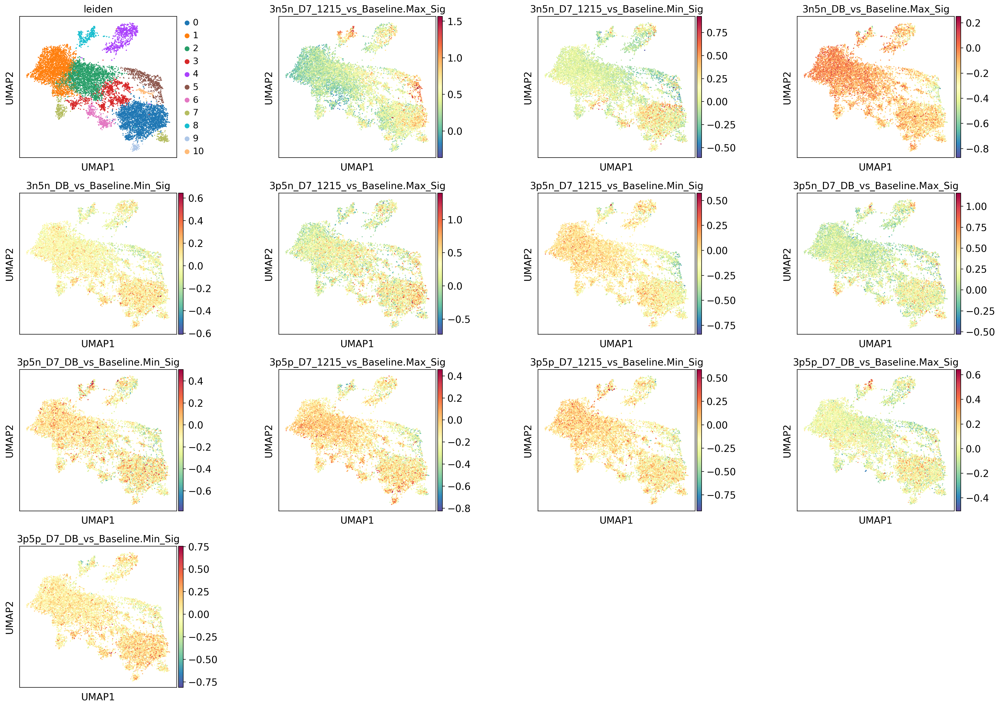

In [49]:
sc.pl.umap(adata, color=['leiden', '3n5n_D7_1215_vs_Baseline.Max_Sig', '3n5n_D7_1215_vs_Baseline.Min_Sig', '3n5n_DB_vs_Baseline.Max_Sig', '3n5n_DB_vs_Baseline.Min_Sig', '3p5n_D7_1215_vs_Baseline.Max_Sig', '3p5n_D7_1215_vs_Baseline.Min_Sig', '3p5n_D7_DB_vs_Baseline.Max_Sig', '3p5n_D7_DB_vs_Baseline.Min_Sig', '3p5p_D7_1215_vs_Baseline.Max_Sig', '3p5p_D7_1215_vs_Baseline.Min_Sig', '3p5p_D7_DB_vs_Baseline.Max_Sig', '3p5p_D7_DB_vs_Baseline.Min_Sig'], wspace=0.5,add_outline=False,
          save=".pdf")

In [24]:
df3 = pd.read_excel("/mnt/longterm/lugli/spuccio/SP044_GZMK/Signatures_GZMK.xlsx",sheet_name="Timepoint_DEG")

In [25]:
df3

,1215_5-3+_vs_5-3-.Max,1215_5-3+_vs_5-3-.Min,1215_5+3+_vs_5-3-.Max,1215_5+3+_vs_5-3-.Min,1215_5+3+_vs_5-3+.Max,1215_5+3+_vs_5-3+.Min,Baseline_5-3+_vs_5-3-.Max,Baseline_5-3+_vs_5-3-.Min,Baseline_5+3+_vs_5-3-.Max,Baseline_5+3+_vs_5-3-.Min,Baseline_5+3+_vs_5-3+.Max,Baseline_5+3+_vs_5-3+.Min,DB_5-3+_vs_5-3-.Max,DB_5-3+_vs_5-3-.Min,DB_5+3+_vs_5-3-.Max,DB_5+3+_vs_5-3-.Min,DB_5+3+_vs_5-3+.Max,DB_5+3+_vs_5-3+.Min
0,IL18RAP,C1orf162,IL12RB2,IFNGR2,EOMES,IFNGR2,UTS2,IFITM3,MGST2,PXN,IFITM3,CCDC144A,TNFSF11,CXCR3,GYG1,RTKN2,EOMES,ECE1
1,IL12RB2,SLC40A1,NAPSB,NEFL,PRR5L,MAL,FMN1,RAB37,MRPL23,KCNN4,CCL3L3,GPR63,IFNGR2,GYG1,EOMES,TNFSF11,ELOVL4,ADTRP
2,ITGA1,CCR4,PLCG2,IFIT3,DTHD1,LRRN3,HLA-DPB2,AEN,ALOX5AP,AEN,RAB34,NCF2,KCNK1,CCR1,ANTXR2,IFNGR2,PLEK,NT5E
3,CD38,IL6R,ENPEP,TNFRSF4,CXCR5,LIMS2,USP32P1,COL6A2,A1BG,ATAD3B,NaN,FMN1,FANK1,LAG3,TIMD4,SOWAHC,S1PR5,RTKN2
4,PLCG2,IL9R,PECAM1,IL9R,PLXND1,SUSD3,CCDC144A,HYOU1,KBTBD3,PI16,NaN,SATB2,SOWAHC,F2R,GZMK,ANK1,MPV17L2,RXRA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1967,NaN,NaN,SLC12A6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1968,NaN,NaN,PRKAA1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1969,NaN,NaN,SUPT16H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970,NaN,NaN,E2F6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
# Melt the DataFrame to long format
melted_df = df3.melt(var_name='Set', value_name='Gene').dropna()

In [27]:
melted_df

,Set,Gene
0,1215_5-3+_vs_5-3-.Max,IL18RAP
1,1215_5-3+_vs_5-3-.Max,IL12RB2
2,1215_5-3+_vs_5-3-.Max,ITGA1
3,1215_5-3+_vs_5-3-.Max,CD38
4,1215_5-3+_vs_5-3-.Max,PLCG2
...,...,...
33550,DB_5+3+_vs_5-3+.Min,BCL2L14
33551,DB_5+3+_vs_5-3+.Min,DIXDC1
33552,DB_5+3+_vs_5-3+.Min,TDRD7
33553,DB_5+3+_vs_5-3+.Min,ELOVL7


In [28]:
# Create a boolean DataFrame indicating the presence of each gene in each set
boolean_df = melted_df.assign(Presence=1).pivot_table(index='Gene', columns='Set', values='Presence', fill_value=0)

In [29]:
boolean_df

Set,1215_5+3+_vs_5-3+.Max,1215_5+3+_vs_5-3+.Min,1215_5+3+_vs_5-3-.Max,1215_5+3+_vs_5-3-.Min,1215_5-3+_vs_5-3-.Max,1215_5-3+_vs_5-3-.Min,Baseline_5+3+_vs_5-3+.Max,Baseline_5+3+_vs_5-3+.Min,Baseline_5+3+_vs_5-3-.Max,Baseline_5+3+_vs_5-3-.Min,Baseline_5-3+_vs_5-3-.Max,Baseline_5-3+_vs_5-3-.Min,DB_5+3+_vs_5-3+.Max,DB_5+3+_vs_5-3+.Min,DB_5+3+_vs_5-3-.Max,DB_5+3+_vs_5-3-.Min,DB_5-3+_vs_5-3-.Max,DB_5-3+_vs_5-3-.Min
Gene,,,,,,,,,,,,,,,,,,
A1BG,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
A2M,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACS,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAK1,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAMDC,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM8,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
ZW10,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
ZWILCH,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [30]:
# Melt the DataFrame to long format
melted_df = df3.melt(var_name='Set', value_name='Gene').dropna()

# Create a boolean DataFrame indicating the presence of each gene in each set
boolean_df = melted_df.assign(Presence=1).pivot_table(index='Gene', columns='Set', values='Presence', fill_value=0)

# Check the prepared DataFrame
print(boolean_df.head())

Set    1215_5+3+_vs_5-3+.Max  1215_5+3+_vs_5-3+.Min  1215_5+3+_vs_5-3-.Max  \
Gene                                                                         
A1BG                     0.0                    0.0                    0.0   
A2M                      0.0                    0.0                    0.0   
AACS                     0.0                    0.0                    1.0   
AAK1                     0.0                    0.0                    0.0   
AAMDC                    0.0                    0.0                    0.0   

Set    1215_5+3+_vs_5-3-.Min  1215_5-3+_vs_5-3-.Max  1215_5-3+_vs_5-3-.Min  \
Gene                                                                         
A1BG                     1.0                    0.0                    0.0   
A2M                      0.0                    0.0                    1.0   
AACS                     0.0                    1.0                    0.0   
AAK1                     1.0                    0.0            

In [31]:
df3 = boolean_df.replace({0.0:False , 1.0: True}, inplace=False)

In [50]:
df4.to_csv("/home/lugli/spuccio/Projects/SP039/GBmap/testdf4.csv",sep="\t",header=True,index=True)

In [35]:
df4 = from_indicators(df3, data=df3)

{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: ylabel='Intersection size'>}

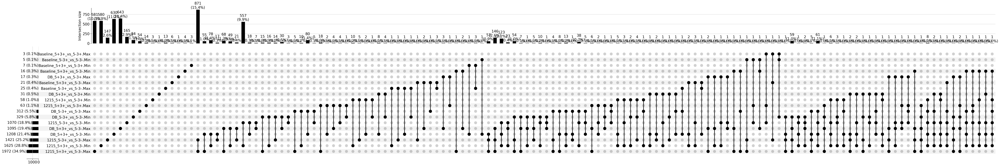

In [36]:
plot(df4,min_subset_size=1,show_counts=True,show_percentages=True)

<Figure size 1000x1000 with 0 Axes>

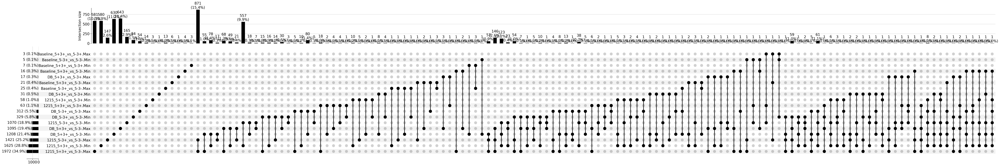

In [37]:
fig = plt.figure(figsize=(10, 10))
plot(df4,min_subset_size=1,show_counts=True,show_percentages=True)
plt.savefig("upset_plot_Subs_DEG2.png", dpi=300)
plt.show()

In [38]:
!pwd

/home/lugli/spuccio/Projects/SP039/New_2024


# Check Signatures Df4

In [39]:
df4

Set                                                                                                                                                                                                                                                                                                                                                                                                                      1215_5+3+_vs_5-3+.Max  \
1215_5+3+_vs_5-3+.Max 1215_5+3+_vs_5-3+.Min 1215_5+3+_vs_5-3-.Max 1215_5+3+_vs_5-3-.Min 1215_5-3+_vs_5-3-.Max 1215_5-3+_vs_5-3-.Min Baseline_5+3+_vs_5-3+.Max Baseline_5+3+_vs_5-3+.Min Baseline_5+3+_vs_5-3-.Max Baseline_5+3+_vs_5-3-.Min Baseline_5-3+_vs_5-3-.Max Baseline_5-3+_vs_5-3-.Min DB_5+3+_vs_5-3+.Max DB_5+3+_vs_5-3+.Min DB_5+3+_vs_5-3-.Max DB_5+3+_vs_5-3-.Min DB_5-3+_vs_5-3-.Max DB_5-3+_vs_5-3-.Min                          
False                 False                 False                 True                  False                 False                 False                     False                     True                      False                     False                     False                     False               False               False               True                False               False                                False   
                                                                  False                 False                 True                  False                     False                     False                     False                     False                     False                     False               False               False               False               False               False                                False   
                                            True                  False                 True                  False                 False                     False                     False                     False                     False                     False                     False               False               False               False               False               False                                False   
                                            False                 True                  False                 True                  False                     False                     False                     False                     False                     False                     False               False               False               False               False               False                                False   
                                                                                                              False                 False                     False                     False                     False                     False                     False                     False               False               False               False               False               False                                False   
...                                                                                                                                                                                                                                                                                                                                                                                                                                        ...   
                                            True                  False                 False                 False                 False                     False                     False                     False                     False                     False                     False               False               False               True                False               False                                False   
                                                                                        True  

In [40]:
df4.columns

Index(['1215_5+3+_vs_5-3+.Max', '1215_5+3+_vs_5-3+.Min',
       '1215_5+3+_vs_5-3-.Max', '1215_5+3+_vs_5-3-.Min',
       '1215_5-3+_vs_5-3-.Max', '1215_5-3+_vs_5-3-.Min',
       'Baseline_5+3+_vs_5-3+.Max', 'Baseline_5+3+_vs_5-3+.Min',
       'Baseline_5+3+_vs_5-3-.Max', 'Baseline_5+3+_vs_5-3-.Min',
       'Baseline_5-3+_vs_5-3-.Max', 'Baseline_5-3+_vs_5-3-.Min',
       'DB_5+3+_vs_5-3+.Max', 'DB_5+3+_vs_5-3+.Min', 'DB_5+3+_vs_5-3-.Max',
       'DB_5+3+_vs_5-3-.Min', 'DB_5-3+_vs_5-3-.Max', 'DB_5-3+_vs_5-3-.Min'],
      dtype='object', name='Set')

In [41]:
Baseline_5plus3plus_vs_5minus3plusMin_Signatures = df3.loc[
    (df3['Baseline_5+3+_vs_5-3+.Min'] == True) &  # This should be True
    (df3[['1215_5+3+_vs_5-3+.Max', '1215_5+3+_vs_5-3+.Min',
          '1215_5+3+_vs_5-3-.Max', '1215_5+3+_vs_5-3-.Min',
          '1215_5-3+_vs_5-3-.Max', '1215_5-3+_vs_5-3-.Min',
          'Baseline_5+3+_vs_5-3+.Max', 
          'Baseline_5+3+_vs_5-3-.Max', 'Baseline_5+3+_vs_5-3-.Min',
          'Baseline_5-3+_vs_5-3-.Max', 'Baseline_5-3+_vs_5-3-.Min',
          'DB_5+3+_vs_5-3+.Max', 'DB_5+3+_vs_5-3+.Min', 'DB_5+3+_vs_5-3-.Max',
          'DB_5+3+_vs_5-3-.Min', 'DB_5-3+_vs_5-3-.Max', 'DB_5-3+_vs_5-3-.Min']]
     == False).all(axis=1)  # Ensures all other columns are False
]


In [42]:
filtered_dfs = {}  # Dictionary to store filtered DataFrames

for col in df3.columns:
    filtered_dfs[col] = df3.loc[
        (df3[col] == True) &  # The current column should be True
        (df3.drop(columns=[col]) == False).all(axis=1)  # All other columns should be False
    ]

In [43]:
for col, df in filtered_dfs.items():
    gene_list = list(df.index)  # Extract gene list
    
    # Filter out genes not in adata.var_names
    valid_genes = [gene for gene in gene_list if gene in adata.var_names]

    if not valid_genes:  # Skip if no valid genes remain
        print(f"Skipping {col} - No valid genes found.")
        continue
    
    try:
        sc.tl.score_genes(
            adata=adata,
            gene_list=valid_genes,  # Use only valid genes
            ctrl_size=50,
            gene_pool=None,
            n_bins=25,
            score_name=f"{col}_Sig",  # Dynamically name the score
            random_state=0,
            use_raw=False,
        )
        print(f"Successfully scored {col}.")
    
    except Exception as e:
        print(f"Error processing {col}: {e}")


Successfully scored 1215_5+3+_vs_5-3+.Max.
Successfully scored 1215_5+3+_vs_5-3+.Min.
Successfully scored 1215_5+3+_vs_5-3-.Max.
Successfully scored 1215_5+3+_vs_5-3-.Min.
Successfully scored 1215_5-3+_vs_5-3-.Max.
Successfully scored 1215_5-3+_vs_5-3-.Min.
Skipping Baseline_5+3+_vs_5-3+.Max - No valid genes found.
Successfully scored Baseline_5+3+_vs_5-3+.Min.
Successfully scored Baseline_5+3+_vs_5-3-.Max.
Successfully scored Baseline_5+3+_vs_5-3-.Min.
Successfully scored Baseline_5-3+_vs_5-3-.Max.
Skipping Baseline_5-3+_vs_5-3-.Min - No valid genes found.
Skipping DB_5+3+_vs_5-3+.Max - No valid genes found.
Successfully scored DB_5+3+_vs_5-3+.Min.
Successfully scored DB_5+3+_vs_5-3-.Max.
Successfully scored DB_5+3+_vs_5-3-.Min.
Successfully scored DB_5-3+_vs_5-3-.Max.
Successfully scored DB_5-3+_vs_5-3-.Min.


In [44]:
adata

AnnData object with n_obs × n_vars = 12873 × 13690
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status', '3n5n_D7_1215_vs_Baseline.Max_Sig', '3n5n_D7_1215_vs_Baseline.Min_Sig', '3n5n_DB_vs_Baseline.Max_Sig', '3n5n_DB_vs_Baseline.Min_Sig', '3p5n_D7_1215_vs_Baseline.Max_Sig', '3p5n_D7_1215_vs_Baseline.Min_Sig', '3p5n_D7_DB_vs_Baseline.Max_Sig', '3p5n_D7_DB_vs_Baseline.Min_Sig', '3p5p_D7_1215_vs_Baseline.Max_Sig', '3p5p_D7_1215_vs_Baseline.Min_Sig', '3p5p_D7_DB_vs_Baseline.Max_Sig', '3p5p_D7_DB_vs_Baseline.Min_Sig', '1215_5+3+_vs_5-3+.Max_Sig', '1215_5+3+_vs_5-3+.Min_Sig', '1215_5+3+_vs_5-3-.Max_Sig', '1215_5+3+_vs_5-3-.Min_Sig', '1215_5-3+_vs_5-3-.Max_Sig', '1215_5-3+_vs_5-3-.Min_Sig', 'Baseline_5+3+_vs_5-3+.Min_Sig', 'Baseline_5+

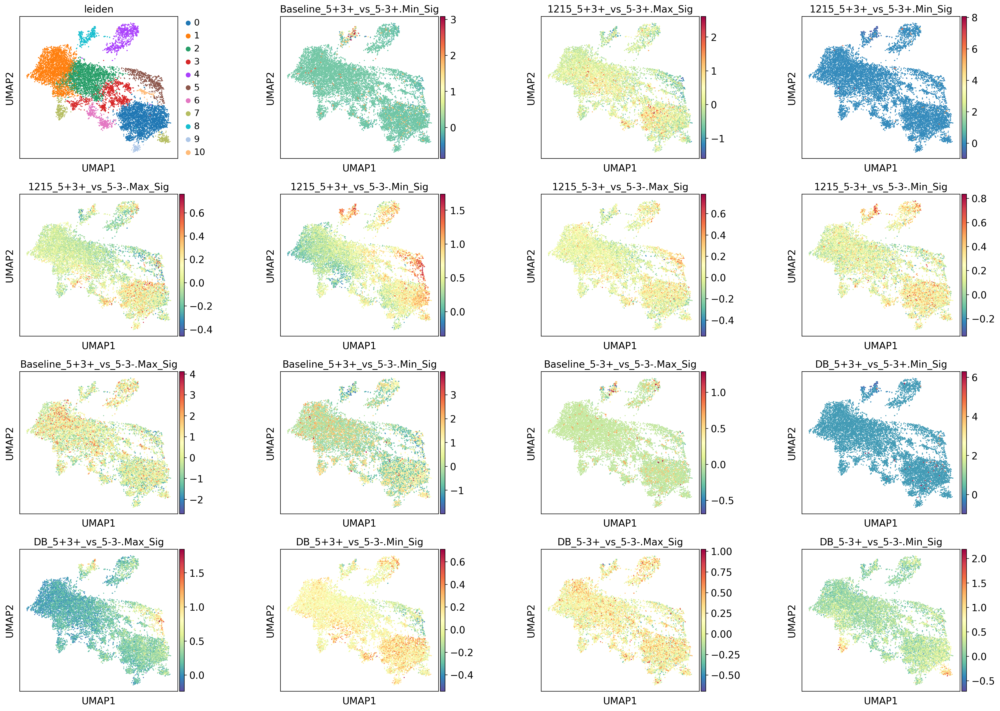

In [48]:
sc.pl.umap(adata, color=['leiden', 'Baseline_5+3+_vs_5-3+.Min_Sig', '1215_5+3+_vs_5-3+.Max_Sig', '1215_5+3+_vs_5-3+.Min_Sig', '1215_5+3+_vs_5-3-.Max_Sig', '1215_5+3+_vs_5-3-.Min_Sig', '1215_5-3+_vs_5-3-.Max_Sig', '1215_5-3+_vs_5-3-.Min_Sig', 'Baseline_5+3+_vs_5-3-.Max_Sig', 'Baseline_5+3+_vs_5-3-.Min_Sig', 'Baseline_5-3+_vs_5-3-.Max_Sig', 'DB_5+3+_vs_5-3+.Min_Sig', 'DB_5+3+_vs_5-3-.Max_Sig', 'DB_5+3+_vs_5-3-.Min_Sig', 'DB_5-3+_vs_5-3-.Max_Sig', 'DB_5-3+_vs_5-3-.Min_Sig'], wspace=0.5,add_outline=False,
          save="2.pdf")

In [46]:
adata

AnnData object with n_obs × n_vars = 12873 × 13690
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status', '3n5n_D7_1215_vs_Baseline.Max_Sig', '3n5n_D7_1215_vs_Baseline.Min_Sig', '3n5n_DB_vs_Baseline.Max_Sig', '3n5n_DB_vs_Baseline.Min_Sig', '3p5n_D7_1215_vs_Baseline.Max_Sig', '3p5n_D7_1215_vs_Baseline.Min_Sig', '3p5n_D7_DB_vs_Baseline.Max_Sig', '3p5n_D7_DB_vs_Baseline.Min_Sig', '3p5p_D7_1215_vs_Baseline.Max_Sig', '3p5p_D7_1215_vs_Baseline.Min_Sig', '3p5p_D7_DB_vs_Baseline.Max_Sig', '3p5p_D7_DB_vs_Baseline.Min_Sig', '1215_5+3+_vs_5-3+.Max_Sig', '1215_5+3+_vs_5-3+.Min_Sig', '1215_5+3+_vs_5-3-.Max_Sig', '1215_5+3+_vs_5-3-.Min_Sig', '1215_5-3+_vs_5-3-.Max_Sig', '1215_5-3+_vs_5-3-.Min_Sig', 'Baseline_5+3+_vs_5-3+.Min_Sig', 'Baseline_5+

In [54]:
!pwd

/mnt/longterm/lugli/spuccio/SP044_GZMK
